Reference: [Sequence Of Boxes](https://docs.google.com/document/d/14vPryt1JFE6Si89VamwMOi-RASeXmMXpo0_BjT_hn-U/edit?usp=sharing)


# TODO

- [x] Fix the validation loss metric.
- [x] Incorporate LR decay from the [Segmenter](https://arxiv.org/abs/2105.05633) paper.
- [x] Align the model with ViT. Remove bias from attention and MLP.
- [x] mIoU Implementation.
- [x] Align input augmentations.
  - [x] Mean Substraction
  - [x] Random Horizontal Flip. Both images and masks should be identically augmented.
  - [x] Random Resize.
- [x] Capability to reload model checkpoints for multiple training runs.
- [x] Align regularization. Stochastic Depth. Reference: https://keras.io/examples/vision/cct/
- [x] Remove Dropouts.
- [x] Add rotation and scaling augmentations.
- [x] Ignore background pixels

# Instructions to run on Kaggle

- [] Enable the install of codelab_utils.git.
- [] Enable import of kaggle_secrets module.
- [] Enable WANDB Init.
- [] Batch Size.
- [] Dataset Source.
- [] Dataset Splits.
- [] Enable AUTOTUNE.
- [] Comment out the optimizer initializations other than the one for the main training loop.
- [] Epochs and Epoch Done.
- [] Enable WANDB Run Initialization.
- [] Fix checkpoint path.
- [] Preload weights from the previous run.
- [] Enable WANDB Run Publish.
- [] Enable WANDB Run Finish.

# Instruction to continue a run on Kaggle

- [] Adjust EPOCHS and EPOCHS_DONE
- [] Ensure that the weights are loaded from the previous run.

# Import Necessary Modules

In [2]:
# ! pip install -q git+https://github.com/EfficientDL/codelab_utils.git

import pickle
import math
import operator
import os
import wandb

import codelab_utils.mpl_styles as mpl_styles
import numpy as np
import seaborn as sns
import pandas as pd
import tensorflow as tf
import tensorflow_datasets as tfds
import albumentations as A

from tensorflow.keras import layers, metrics, losses, utils, initializers, optimizers
from tensorflow.keras import applications as apps, callbacks as cbs
from tensorflow.keras.utils import plot_model, img_to_array
from datasets import load_dataset, load_dataset_builder
from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint
# from kaggle_secrets import UserSecretsClient # Kaggle
from matplotlib import pyplot as plt
from matplotlib import patches as patches
from itertools import accumulate
from functools import reduce
from collections import Counter
from pathlib import Path

mpl_styles.set_default_styles()
plt.rcParams['font.family'] = 'Poppins'

os.environ['WANDB_NOTEBOOK_NAME'] = 'Segmenter'

DEBUG = False

wandb: ERROR Unable to patch Tensorflow/Keras
exception while trying to patch_tf_keras
Traceback (most recent call last):
  File "/Users/broxoli/venv-tensorflow/lib/python3.11/site-packages/wandb/integration/keras/keras.py", line 86, in patch_tf_keras
    from keras.engine import training
ModuleNotFoundError: No module named 'keras.engine'
wandb: ERROR Unable to patch Tensorflow/Keras
exception while trying to patch_tf_keras
Traceback (most recent call last):
  File "/Users/broxoli/venv-tensorflow/lib/python3.11/site-packages/wandb/integration/keras/keras.py", line 86, in patch_tf_keras
    from keras.engine import training
ModuleNotFoundError: No module named 'keras.engine'
wandb: ERROR Unable to patch Tensorflow/Keras
exception while trying to patch_tf_keras
Traceback (most recent call last):
  File "/Users/broxoli/venv-tensorflow/lib/python3.11/site-packages/wandb/integration/keras/keras.py", line 86, in patch_tf_keras
    from keras.engine import training
ModuleNotFoundError: No mo

# Initialize WANDB

In [2]:
# user_secrets = UserSecretsClient()
# wandb_api_key = user_secrets.get_secret("WANDB_API_KEY")
# os.environ['WANDB_API_KEY'] = wandb_api_key

# Dataset Initialization

* Download scene_parse150, an semantic segmentation dataset.
* Dataset class labels are available at [CSAILVision](https://github.com/CSAILVision/sceneparsing/blob/master/objectInfo150.csv)

## Hyperparameters

In [2]:
BATCH_SIZE = 2
# BATCH_SIZE = 8 # Kaggle

## Load Tensorflow Dataset

In [4]:
# DS_NAME = 'scene_parse150'
# DS_SPLITS = ['train[:5]', 'train[5:10]', 'test']
# # DS_SPLITS = ['train[:80%]', 'train[80%:]', 'test'], # Kaggle

# # Load scene_parse150 dataset
# (train_ds, val_ds, test_ds), info = tfds.load(
#     'scene_parse150',
#     split=DS_SPLITS,
#     # data_dir='/kaggle/input/scene-parse-150-tf', # Kaggle
#     read_config=tfds.ReadConfig(try_autocache=False),
#     with_info=True,
# )

# # info

## Load HuggingFace Dataset

In [38]:
DS_NAME = "scene_parse_150"
# DS_SPLITS = dict(
#     train='train[:5]',
#     validation='validation[:5]',
#     test='test[:5]',
# )
DS_SPLITS = dict(
    train='train',
    validation='validation',
    test='test',
)# Kaggle
def make_generator(ds, with_annotation=True):
    def with_annotation_fn():
        for item in iter(ds): 
            yield (item['image'], item['annotation'])
    
    def fn():
        for item in iter(ds):
            yield item['image']
    
    return with_annotation_fn if with_annotation else fn

def load_split(ds_name, split, with_annotation=True):
    def filter_with_annotation(image, annotation):
        return len(tf.shape(image)) == 3
    
    def filter_fn(image):
        return len(tf.shape(image)) == 3

    ds = load_dataset(ds_name, split=split)
    # ds = load_dataset(
    #     ds_name,
    #     split=split,
    #     cache_dir="/kaggle/input/scene-parse-150-hf/huggingface"
    # ) # Kaggle

    print(f"Split: {split} Items: {ds.num_rows} Features: {ds.features.keys()}")
    
    tf_ds = tf.data.Dataset.from_generator(
        make_generator(ds, with_annotation=with_annotation),
        (tf.uint8, tf.uint8) if with_annotation else tf.uint8
    ) # Kaggle
    tf_ds = tf_ds.filter(filter_with_annotation if with_annotation else filter_fn) # Kaggle
    
    return tf_ds, ds.num_rows # Kaggle
    # return ds.to_tf_dataset(), ds.num_rows

ds_builder = load_dataset_builder(DS_NAME)
splits = ds_builder.info.splits
split_infos = list(map(lambda k: (k, splits[k].num_examples), splits.keys()))

print(f"Available Splits: {split_infos}")

train_ds, train_count = load_split(DS_NAME, DS_SPLITS['train'])
val_ds, val_count = load_split(DS_NAME, DS_SPLITS['validation'])
test_ds, test_count = load_split(DS_NAME, DS_SPLITS['test'], with_annotation=False)

def ds_shape(ds, size, with_annotation=True, name='Training'):
    print(f'\n{name} Set')
    print('------------------')
    print(f'Size: {size}')
    
    if with_annotation:
        image, mask = next(iter(ds))
        print(f'Image Shape: {image.shape} Mask Shape: {mask.shape}')
    else:
        image = next(iter(ds))
        print(f'Image Shape: {image.shape}')

ds_shape(train_ds, train_count)
ds_shape(val_ds, val_count)
ds_shape(test_ds, test_count, with_annotation=False)

No config specified, defaulting to: scene_parse_150/scene_parsing


Available Splits: [('train', 20210), ('test', 3352), ('validation', 2000)]


No config specified, defaulting to: scene_parse_150/scene_parsing
Found cached dataset scene_parse_150 (/Users/broxoli/.cache/huggingface/datasets/scene_parse_150/scene_parsing/1.0.0/d998c54e1b5c5bad12b4d2ec7e1a5f74eee4c153bc1b089a0001677ae9b3fd75)


Split: train Items: 20210 Features: dict_keys(['image', 'annotation', 'scene_category'])


No config specified, defaulting to: scene_parse_150/scene_parsing
Found cached dataset scene_parse_150 (/Users/broxoli/.cache/huggingface/datasets/scene_parse_150/scene_parsing/1.0.0/d998c54e1b5c5bad12b4d2ec7e1a5f74eee4c153bc1b089a0001677ae9b3fd75)


Split: validation Items: 2000 Features: dict_keys(['image', 'annotation', 'scene_category'])


No config specified, defaulting to: scene_parse_150/scene_parsing
Found cached dataset scene_parse_150 (/Users/broxoli/.cache/huggingface/datasets/scene_parse_150/scene_parsing/1.0.0/d998c54e1b5c5bad12b4d2ec7e1a5f74eee4c153bc1b089a0001677ae9b3fd75)


Split: test Items: 3352 Features: dict_keys(['image', 'annotation', 'scene_category'])

Training Set
------------------
Size: 20210
Image Shape: (180, 300, 3) Mask Shape: (180, 300)

Training Set
------------------
Size: 2000
Image Shape: (256, 256, 3) Mask Shape: (256, 256)

Training Set
------------------
Size: 3352
Image Shape: (765, 512, 3)


# Plotting Functions for Related Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


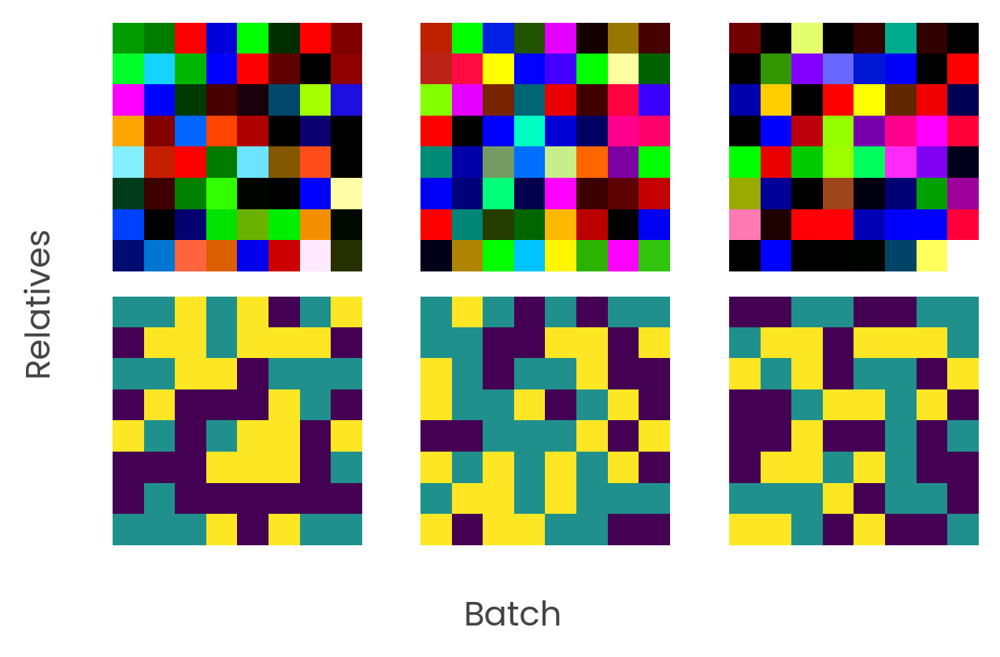

In [4]:
def visualize_item(ax, item):
    ax.imshow(item)
    ax.set_axis_off()

def show_related_images(*relatives, batch_to_rows=True, title='', size=1.5):
    num_relatives, relative_dims = len(relatives), len(relatives[0].shape)

    if relative_dims == 3:
        relatives = list(map(lambda x: tf.expand_dims(x, axis=0), relatives))
    
    batch_size = relatives[0].shape[0]
    items = tf.range(batch_size*num_relatives)

    if batch_to_rows:
        fig, axes = plt.subplots(batch_size, num_relatives, figsize=(num_relatives*size, batch_size*size))
        rows, cols = tf.unravel_index(indices=items, dims=[batch_size, num_relatives])

        fig.supylabel('Batch')
        fig.supxlabel('Relatives')
    else:
        fig, axes = plt.subplots(num_relatives, batch_size, figsize=(batch_size*size, num_relatives*size))
        rows, cols = tf.unravel_index(indices=items, dims=[num_relatives, batch_size])

        fig.supxlabel('Batch')
        fig.supylabel('Relatives')

    axes = axes.ravel()

    for item_id in range(batch_size*num_relatives):
        row, col = rows[item_id], cols[item_id]
        ax = axes[item_id]

        item = relatives[col][row] if batch_to_rows else relatives[row][col]
        visualize_item(ax, item)
    
    fig.suptitle(title)
    fig.tight_layout()
    

batch_size, img_size, classes = 3, 8, 3
image = tf.random.normal((batch_size, img_size, img_size, 3))
mask = tf.random.uniform((batch_size, img_size, img_size, 1), maxval=classes, dtype=tf.int32)

show_related_images(image, mask, batch_to_rows=False)

# Input Augmentations

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Input Image: (8, 8, 3) --> Transformed Image: (4, 4, 3)
Input Mask: (8, 8, 1) --> Transformed Mask: (4, 4, 1)


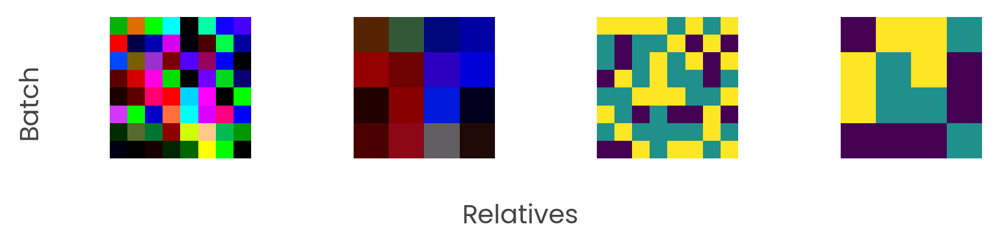

In [5]:
def get_augmenter(size):
    fn = A.Compose([
        A.RandomResizedCrop(width=size, height=size, scale=(0.5, 2.0)),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        A.augmentations.geometric.rotate.Rotate(limit=20, p=1.0),
    ])

    return fn

batch_size, img_size, classes = 2, 8, 3
image = tf.random.normal((img_size, img_size, 3))
mask = tf.random.uniform((img_size, img_size, 1), maxval=classes, dtype=tf.int32)

transform_fn = get_augmenter(4)
result = transform_fn(image=image.numpy(), mask=mask.numpy())
t_image, t_mask = result['image'], result['mask']

print(f'Input Image: {image.shape} --> Transformed Image: {t_image.shape}')
print(f'Input Mask: {mask.shape} --> Transformed Mask: {t_mask.shape}')

show_related_images(image, t_image, mask, t_mask)

# Dataset Preprocessing

Here, we resize the images to a fixed size and filter out the invalid boxes. The boxes are originally expressed as a list in the dataset. We'll transform them to a CYCXHW grid format.

Training Set Preprocessing
--------------------------
Image: (180, 300, 3) Mask: (180, 300) --> Image: (512, 512, 3) Mask: (512, 512)

Validation Set Preprocessing
--------------------------
Image: (256, 256, 3) Mask: (256, 256) --> Image: (512, 512, 3) Mask: (512, 512)

Test Set Preprocessing
--------------------------
Image: (765, 512, 3) --> Image: (512, 512, 3)


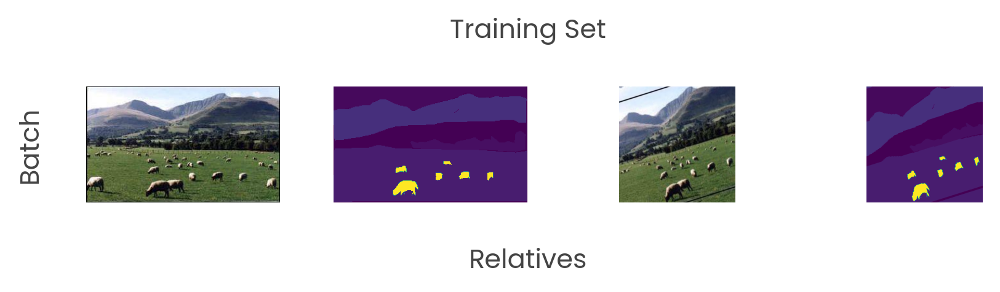

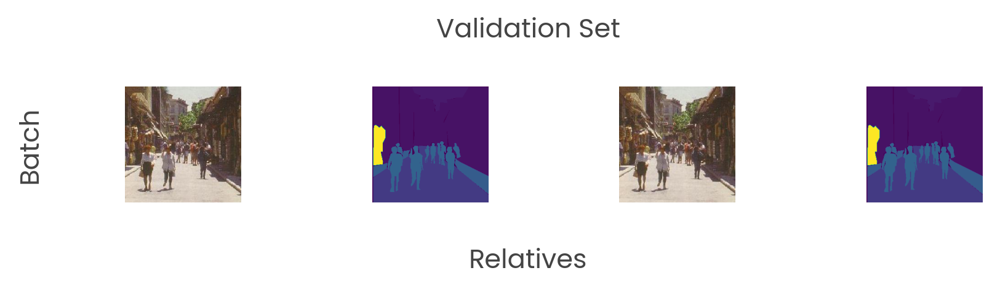

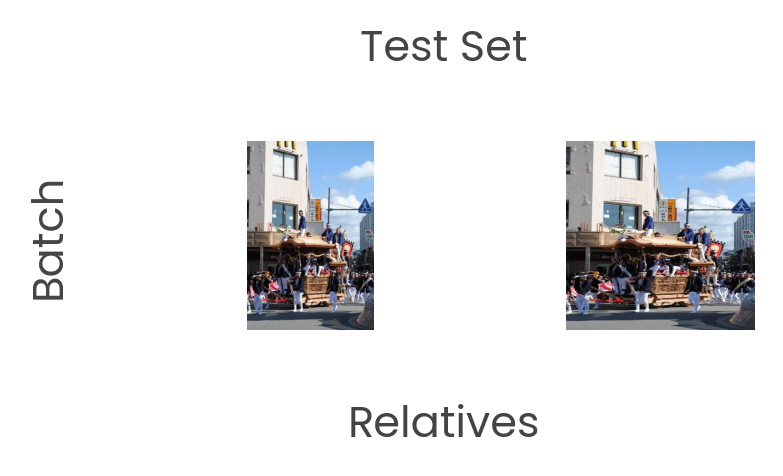

In [6]:
# IMG_SIZE = 256
IMG_SIZE = 512

AUG_FN = get_augmenter(IMG_SIZE)

def transform_fn(image, mask):
    result = AUG_FN(image=image, mask=mask)
    return result['image'], result['mask']

@tf.function
def rescale_and_augment(image, mask):
    # Normalize the image and extract mask
    image = tf.cast(image, tf.float32) / 255.0

    result = tf.numpy_function(transform_fn, [image, mask], [tf.float32, tf.uint8])
    image = result[0]
    mask = result[1]

    return image, mask

@tf.function
def resize_and_scale_fn(x):
    x = tf.expand_dims(x, axis=0)
    x = tf.raw_ops.ResizeNearestNeighbor(images=x, size=[IMG_SIZE, IMG_SIZE])
    x = tf.squeeze(x, axis=0)
    return x

@tf.function
def resize_and_scale(image, mask):
    # Resize image to IMG_SIZE and normalize it.
    image = resize_and_scale_fn(image)
    image = tf.cast(image, tf.float32) / 255.0

    # Resize mask to IMG_SIZE
    mask = tf.squeeze(resize_and_scale_fn(tf.expand_dims(mask, axis=-1)), axis=-1)
    
    return image, mask

@tf.function
def resize_and_scale_test(image):
    # Resize image to IMG_SIZE and normalize it.
    image = resize_and_scale_fn(image)
    image = tf.cast(image, tf.float32) / 255.0

    return image

train_prep_ds = train_ds.map(rescale_and_augment, num_parallel_calls=None)
val_prep_ds = val_ds.map(resize_and_scale, num_parallel_calls=None)
test_prep_ds = test_ds.map(resize_and_scale_test, num_parallel_calls=None)

# train_prep_ds = train_ds.map(rescale_and_augment, num_parallel_calls=tf.data.AUTOTUNE) # Kaggle
# val_prep_ds = val_ds.map(resize_and_scale, num_parallel_calls=tf.data.AUTOTUNE) # Kaggle
# test_prep_ds = test_ds.map(resize_and_scale_test, num_parallel_calls=tf.data.AUTOTUNE) # Kaggle

def show_preprocessing_results(ds, p_ds, title='Preprocessing Results'):
    image = next(iter(ds))
    p_image = next(iter(p_ds))

    print('Image: {} --> Image: {}'.format(image.shape, p_image.shape))

    show_related_images(image, p_image, title=title)

def show_preprocessing_results_with_mask(ds, p_ds, title='Preprocessing Results'):
    image, mask = next(iter(ds))
    p_image, p_mask = next(iter(p_ds))

    print('Image: {} Mask: {} --> Image: {} Mask: {}'.format(image.shape, mask.shape, p_image.shape, p_mask.shape))

    show_related_images(image, mask, p_image, p_mask, title=title)

print('Training Set Preprocessing')
print('--------------------------')
show_preprocessing_results_with_mask(train_ds, train_prep_ds, title='Training Set')

print('\nValidation Set Preprocessing')
print('--------------------------')
show_preprocessing_results_with_mask(val_ds, val_prep_ds, title='Validation Set')

print('\nTest Set Preprocessing')
print('--------------------------')
show_preprocessing_results(test_ds, test_prep_ds, title='Test Set')

# Image Patching

Image: (2, 16, 16, 3) --> Patches: (2, 16, 4, 4, 3)


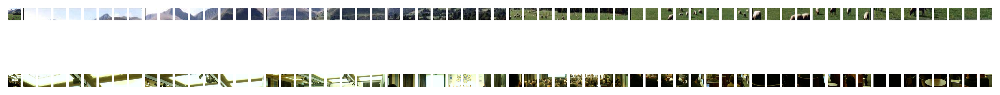

In [47]:
def batch_to_patch(images, patch_size):
    grid_size = images.shape[1]//patch_size
    patch_count = grid_size**2
    sizes=[1, patch_size, patch_size, 1]
    kwargs = dict(sizes=sizes, strides=sizes, rates=[1, 1, 1, 1], padding='VALID')

    # Extract patches from  images
    image_patches = tf.image.extract_patches(images, **kwargs)
    image_patches = tf.reshape(image_patches, [-1, patch_count, patch_size, patch_size, 3])

    return image_patches

batch_size, img_size, patch_size = 2, 16, 4
input_shape = (batch_size, img_size, img_size, 3)
images = tf.reshape(tf.range(reduce(operator.mul, input_shape)), input_shape)

image_patches = batch_to_patch(images, patch_size=patch_size)
print(f'Image: {images.shape} --> Patches: {image_patches.shape}')

ds = train_ds.map(resize_and_scale).batch(2)
itr = iter(ds)
images, _ = next(itr)
patches = batch_to_patch(images, 64)

def visualize_items(axes, items):
    for index, item in enumerate(items):
        axes[index].imshow(item)
        axes[index].set_axis_off()

def show_images_and_patches(images, patches):
    column_axis = lambda axes, id: axes[id]
    batch_size, num_patches = images.shape[0], patches.shape[1]

    _, axes = plt.subplots(batch_size, 1 + num_patches, figsize=(16, 2))

    for item_id in range(batch_size):
        visualize_items(axes[item_id][:1], [images[item_id]])
        visualize_items(axes[item_id][1:], patches[item_id])

show_images_and_patches(images, patches)

# Image Standardization Block

Input Shape: (5, 512, 512, 3) --> Output Shape (5, 512, 512, 3)


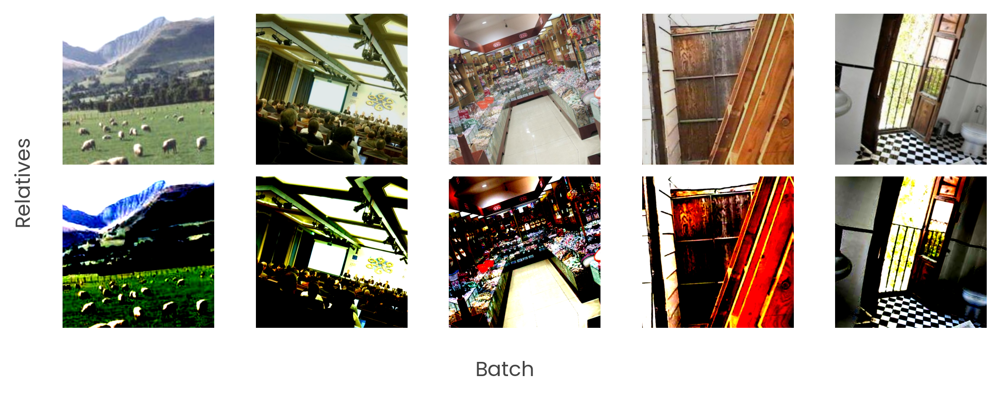

In [80]:
def standardization_block(xx, name='standardization_block'):
    block = tf.keras.Sequential([
        layers.Lambda(tf.image.per_image_standardization),
    ], name=name)

    return block(xx)

images, _ = next(iter(train_prep_ds.batch(10)))
standardized_images = standardization_block(images)

print(f'Input Shape: {images.shape} --> Output Shape {standardized_images.shape}')

show_related_images(images, standardized_images, batch_to_rows=False)

# Show Training and Validation Examples

## Dataset Summary Functions

In [49]:
def ds_summary(ds, name):
    counter = Counter()

    for mask in iter(ds):
        objects, pixel_counts = np.unique(mask, return_counts=True)

        counter.update(dict(zip(objects, pixel_counts)))

    counter_df = pd.DataFrame(counter.items(), columns=['Objects', 'Counts'])
    print(f'{name} Summary')
    print('===================')
    print(f'{counter_df.to_markdown()}')

# ds_summary(train_ds.take(5), 'Test')

In [50]:
def show_mask_details(images, masks, classes, cols=4, size=1.5):
    for index, mask in enumerate(masks):
        mask_df = pd.DataFrame(mask.numpy().flatten(), columns=["Pixel Object"])
        # mask_df.plot.hist(bins=classes)

        frequencies = mask_df["Pixel Object"].value_counts()
        print(f"Total Objects: {frequencies.size}")
        print(f"Object Classes: {np.sort(frequencies.index)}")

        im_objects = map(lambda o: tf.where(mask == o, 1, 0), frequencies.index)
        items = [images[index], *im_objects]

        rows = (len(items) + cols - 1) // cols
        _, axes = plt.subplots(rows, cols, figsize=(cols*size, rows*size))

        axes = axes.ravel()

        labels = ['Image', *frequencies.index]

        for index, item in enumerate(items):
            axes[index].imshow(item)
            axes[index].set_title(labels[index])

        plt.tight_layout()

# batch_size, img_size = 2, 16
# images = tf.random.uniform((2, img_size, img_size, 3))
# masks = tf.random.uniform((2, img_size, img_size), maxval=3, dtype=tf.int32)
# show_mask_details(images, masks, 150, size=2)

Raw Training Summary
|    |   Objects |   Counts |
|---:|----------:|---------:|
|  0 |         0 |    95971 |
|  1 |         3 |     6990 |
|  2 |         5 |     5947 |
|  3 |        10 |    23056 |
|  4 |        17 |    11458 |
|  5 |       127 |     1083 |
|  6 |         1 |   172645 |
|  7 |         4 |   123542 |
|  8 |         6 |   141669 |
|  9 |         9 |    19058 |
| 10 |        13 |    68129 |
| 11 |        19 |    22515 |
| 12 |        20 |    22377 |
| 13 |       131 |     8887 |
| 14 |        25 |   100817 |
| 15 |        41 |   108380 |
| 16 |        42 |    10687 |
| 17 |        44 |     3060 |
| 18 |       113 |     5277 |
| 19 |        15 |    30260 |
| 20 |        28 |      731 |
| 21 |        38 |     7595 |
| 22 |        39 |     4166 |
| 23 |        48 |     3357 |
| 24 |        66 |     2535 |
Training Summary
|    |   Objects |   Counts |
|---:|----------:|---------:|
|  0 |         0 |   121300 |
|  1 |         3 |    32004 |
|  2 |         5 |    24530 |
| 

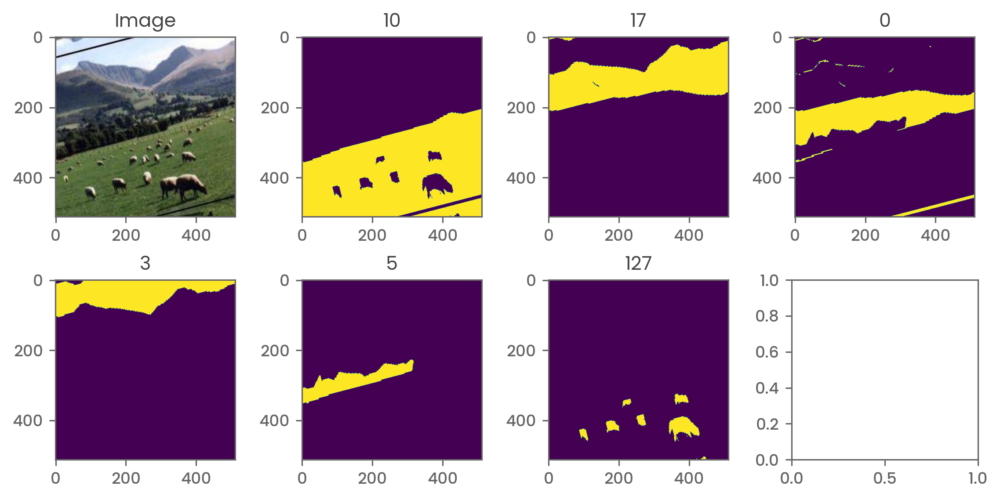

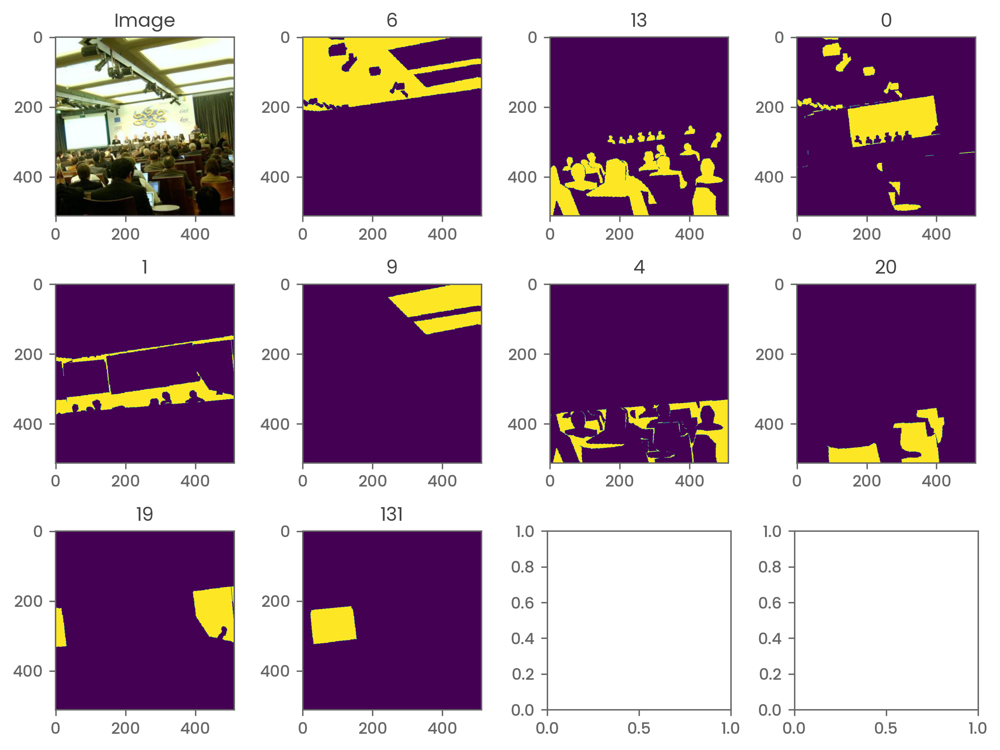

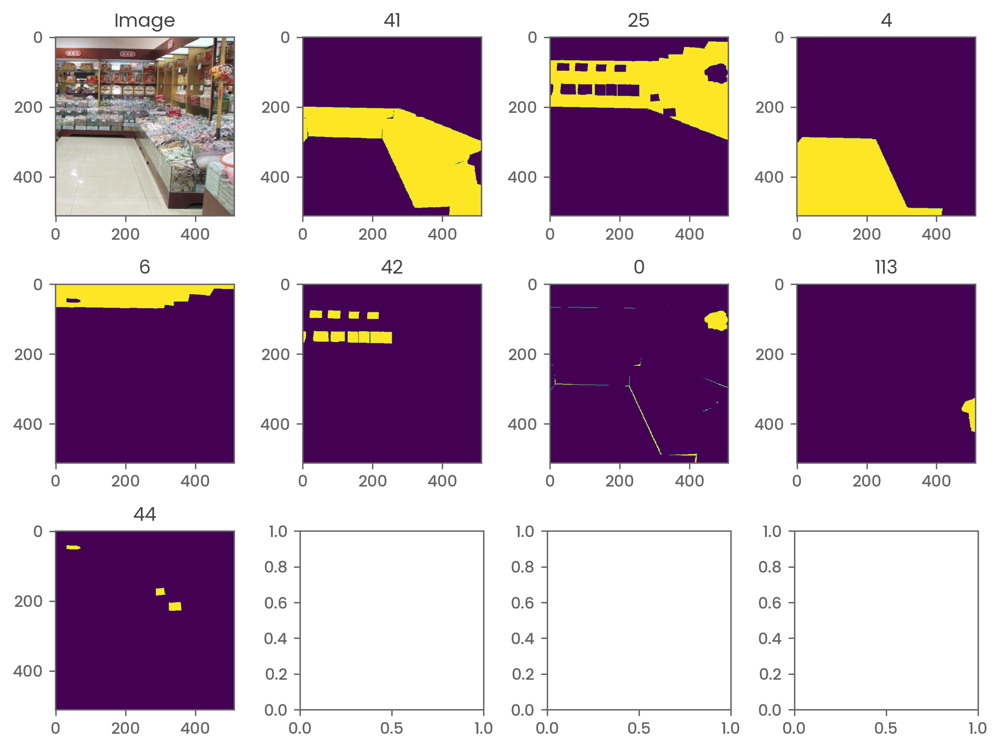

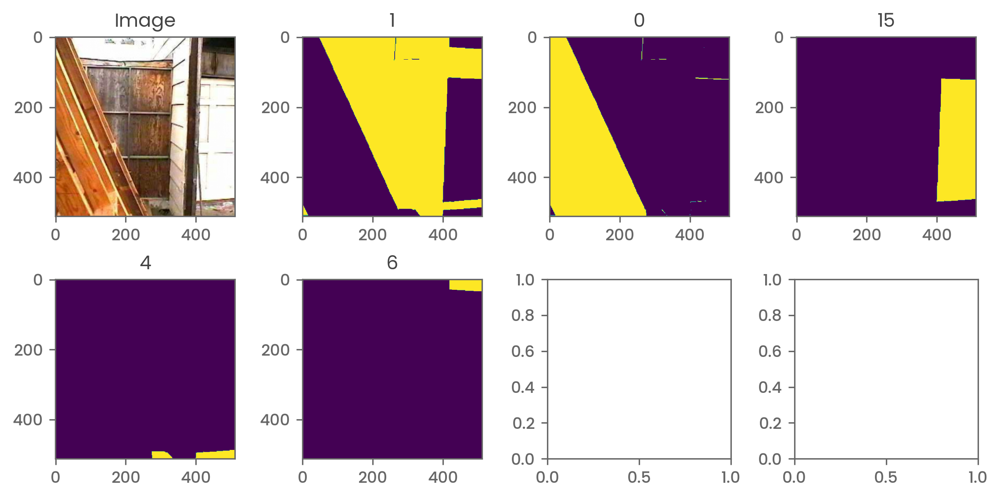

In [52]:
itr = iter(train_prep_ds.batch(4))
images, masks = next(itr)

ds_summary(train_ds.map(lambda _,x: x), 'Raw Training')
ds_summary(train_prep_ds.map(lambda x,y: y), 'Training')
show_mask_details(images, masks, 150, size=2)

Raw Validation Summary
|    |   Objects |   Counts |
|---:|----------:|---------:|
|  0 |         0 |    30592 |
|  1 |         2 |   179633 |
|  2 |         3 |    61202 |
|  3 |         7 |    59902 |
|  4 |        12 |     9691 |
|  5 |        13 |    41775 |
|  6 |        41 |     1853 |
|  7 |         1 |   155837 |
|  8 |         4 |    41338 |
|  9 |         6 |    18554 |
| 10 |         9 |     7160 |
| 11 |        15 |    11165 |
| 12 |        32 |    21571 |
| 13 |        83 |     4735 |
| 14 |        94 |    14373 |
| 15 |        34 |    32557 |
| 16 |        75 |      879 |
| 17 |       142 |      512 |
| 18 |       144 |   151080 |
| 19 |         5 |    35244 |
| 20 |        18 |    78478 |
| 21 |        21 |    32097 |
| 22 |        33 |     2794 |
| 23 |        44 |      112 |
| 24 |        88 |     2067 |
| 25 |       116 |       29 |
| 26 |       124 |     1400 |
| 27 |        10 |   240566 |
Validation Summary
|    |   Objects |   Counts |
|---:|----------:|---------:

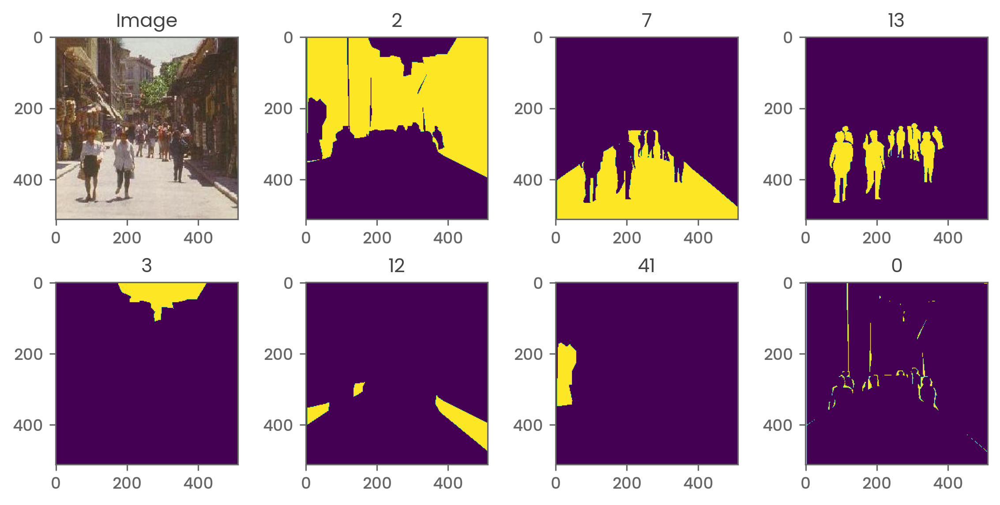

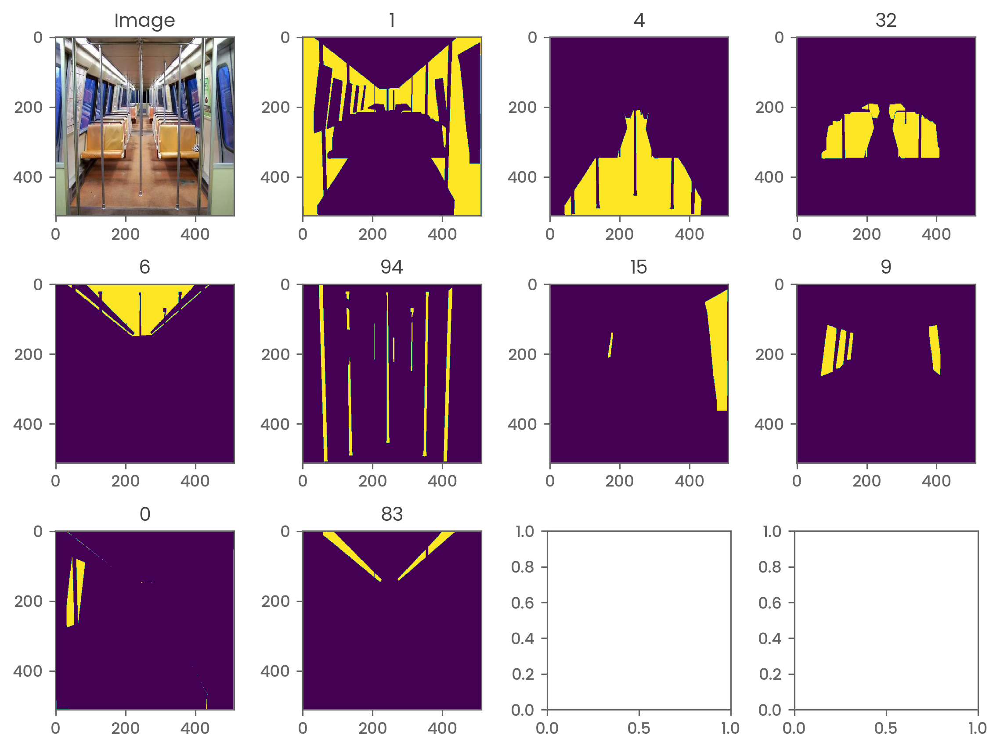

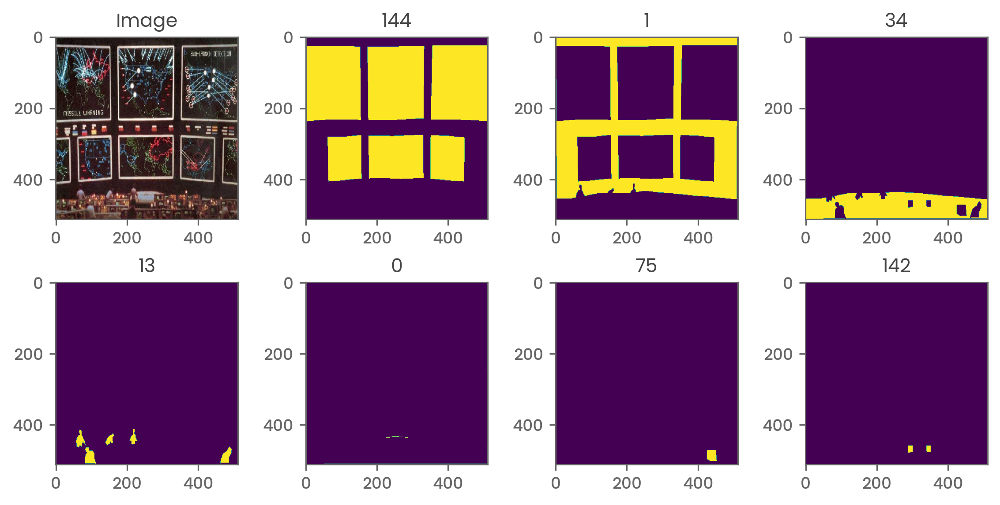

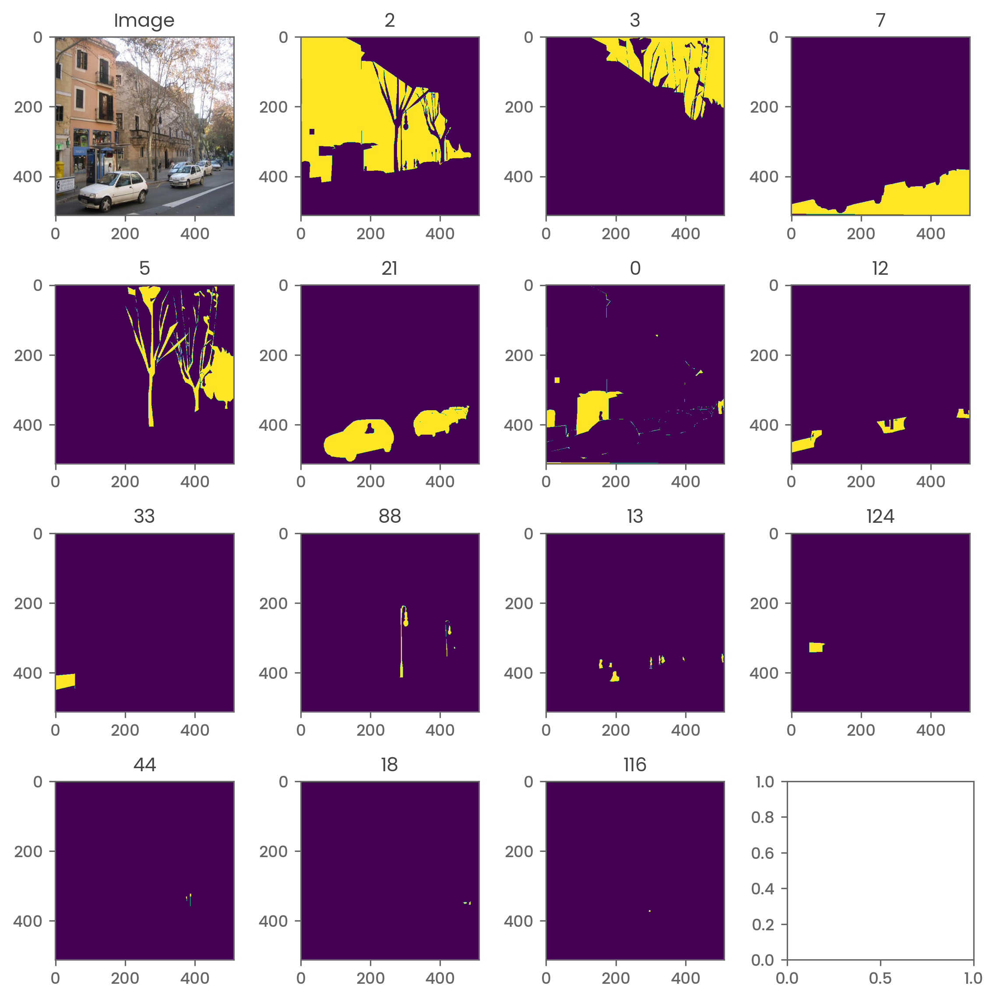

In [53]:
itr = iter(val_prep_ds.batch(4))
images, masks = next(itr)

ds_summary(val_ds.map(lambda _,x: x), 'Raw Validation')
ds_summary(val_prep_ds.map(lambda x,y: y), 'Validation')
show_mask_details(images, masks, 150, size=2)

# ViT Model

## Multilayer Perceptron

In [54]:
def mlp_block(xx, dims, name='mlp_block'):
    block = tf.keras.Sequential([
        layers.Dense(dims*4, activation='gelu', use_bias=False),
        layers.Dense(dims, use_bias=False),
    ], name=name)

    return block(xx)

dims = 8
xx = tf.random.normal((2, 4, 4, 3))
output = mlp_block(xx, dims)

print('Multilayer Perceptron')
print('dims: {}'.format(dims))
print('Input: {} --> {}'.format(xx.shape, output.shape))

Multilayer Perceptron
dims: 8
Input: (2, 4, 4, 3) --> (2, 4, 4, 8)


## PositionEmbedding Layer

In [55]:
class PositionEmbedding(layers.Layer):
    def __init__(self, initializer="glorot_uniform", **kwargs ):
        super().__init__(**kwargs)
        self._initializer = tf.keras.initializers.get(initializer)

    def get_config(self):
        config = {
            "initializer": tf.keras.initializers.serialize(self._initializer),
        }
        base_config = super(PositionEmbedding, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def build(self, input_shape):
        sequence_length = input_shape[-2]
        width = input_shape[-1]

        self._position_embeddings = self.add_weight(
            "position_embeddings",
            shape=[sequence_length, width],
            initializer=self._initializer)

        super().build(input_shape)

    def call(self, inputs):
        return inputs + self._position_embeddings

xx = tf.zeros((2, 4, 12))
l = PositionEmbedding()
output = l(xx)

print('PositionEmbedding Layer')
print('Input: {} --> {}'.format(xx.shape, output.shape))
print(f'Embedding Size: {l.weights[0].shape}')
print(f'Verify Embeddings: {tf.reduce_all(tf.math.equal(output, l.weights))}')

PositionEmbedding Layer
Input: (2, 4, 12) --> (2, 4, 12)
Embedding Size: (4, 12)
Verify Embeddings: True


## Patch Embedding Block

In [56]:
def patch_embedding_block(xx, dims, name='patch_embedding_block'):
    """
        It embeds the input patches in dims-dimensional space.

        Arguments:
            xx: A tensor with shape:
                (BATCH_SIZE, N_PATCHES, PATCH_SIZE*PATCH_SIZE*N_CHANNELS)
            dims: Latent dimensions in the embedding space.
        
        Returns:
            A tensor with shape:
                (BATCH_SIZE, N_PATCHES, dims)
    """
    block = tf.keras.Sequential([
        layers.Dense(dims, use_bias=False)
    ], name=name)

    return block(xx)

dims = 8
xx = tf.random.normal((2, 4, 12))
output = patch_embedding_block(xx, dims)

print('Patch Embedding Block')
print('dims: {}'.format(dims))
print('Input: {} --> {}'.format(xx.shape, output.shape))

Patch Embedding Block
dims: 8
Input: (2, 4, 12) --> (2, 4, 8)


## StochasticDepth Layer

In [57]:
"""It is sourced from tensorflow-models package

Source: https://github.com/tensorflow/models/blob/v2.12.0/official/vision/modeling/layers/nn_layers.py#L227-L262
"""
class StochasticDepth(layers.Layer):
    """Creates a stochastic depth layer."""

    def __init__(self, stochastic_depth_drop_rate, **kwargs):
        """Initializes a stochastic depth layer.

        Args:
          stochastic_depth_drop_rate: A `float` of drop rate.
          **kwargs: Additional keyword arguments to be passed.

        Returns:
          A output `tf.Tensor` of which should have the same shape as input.
        """
        super(StochasticDepth, self).__init__(**kwargs)
        self._drop_rate = stochastic_depth_drop_rate

    def get_config(self):
        config = {'stochastic_depth_drop_rate': self._drop_rate}
        base_config = super(StochasticDepth, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def call(self, inputs, training=None):
        if training is None:
            training = tf.keras.backend.learning_phase()
        if not training or self._drop_rate is None or self._drop_rate == 0:
            return inputs

        keep_prob = 1.0 - self._drop_rate
        batch_size = tf.shape(inputs)[0]
        random_tensor = keep_prob
        random_tensor += tf.random.uniform(
            [batch_size] + [1] * (inputs.shape.rank - 1), dtype=inputs.dtype)
        binary_tensor = tf.floor(random_tensor)
        output = tf.math.divide(inputs, keep_prob) * binary_tensor
        return output

batch_size, num_patches, dims = 2, 256, 768
drop_prob = .5

l = StochasticDepth(drop_prob)
xx = tf.random.normal((batch_size, num_patches, dims))
output = l(xx, training=True)
non_zeros = 1 - (tf.math.reduce_sum(tf.cast(output == 0, tf.int64))/(batch_size * num_patches * dims))

print('StochasticDepth Layer')
print('---------------------')
print(f'batch_size: {batch_size}, num_patches: {num_patches}, dims: {dims}')
print(f'\ndrop_prob: {drop_prob}')
print(f'\nInput: {xx.shape} --> {output.shape}')
print(f'\nOutput Drop Rate: {non_zeros}')

StochasticDepth Layer
---------------------
batch_size: 2, num_patches: 256, dims: 768

drop_prob: 0.5

Input: (2, 256, 768) --> (2, 256, 768)

Output Drop Rate: 1.0


## Encoder Block

In [58]:
def encoder_block(xx, dims, heads, drop_prob=0.1, name='encoder_block'):
    # Save the input 'xx' to use as skip connections later on.
    skip_connection_1 = xx

    ### Attention Computations [Start] ###
    x = layers.LayerNormalization()(xx)
    x = layers.MultiHeadAttention(heads, dims//heads, use_bias=False)(x, x)
    x = StochasticDepth(drop_prob, name=f'stochastic_depth_1_{name}')(x)
    x = x + skip_connection_1
    ### Attention Computations [End] ###

    # Save current 'x' to use as skip connections later on.
    skip_connection_2 = x

    ### MLP Computations [Start] ###
    x = layers.LayerNormalization()(x)
    x = mlp_block(x, dims, name='{}_mlp'.format(name))
    x = StochasticDepth(drop_prob, name=f'stochastic_depth_2_{name}')(x)
    x = x + skip_connection_2
    ### MLP Computations [End] ###

    block = tf.keras.Model(inputs=xx, outputs=x, name=name)
    # block.summary()

    return block(xx)

# dims, heads, dropout_rate = 8, 2, .2
num_patches, dims, heads, drop_prob = 256, 768, 12, .2
xx = tf.keras.Input((num_patches, dims))
output = encoder_block(xx, dims, heads, drop_prob=drop_prob)

print('Encoder Block')
print('dims: {}'.format(dims))
print('Input: {} --> {}'.format(xx.shape, output.shape))

# model = tf.keras.Model(inputs=xx, outputs=output)
# xx = tf.random.normal((2, num_patches, dims))
# model(xx, training=True)

Encoder Block
dims: 768
Input: (None, 256, 768) --> (None, 256, 768)


## Decoder Blocks

### Linear Decoder

In [59]:
def linear_decoder_block(xx, classes, grid_size, img_size, name='linear_decoder_block'):
    # Patch level class logits
    x = layers.Dense(classes)(xx)

    # Patch sequence to H/P x W/P grid
    x = layers.Reshape([grid_size, grid_size, classes])(x)
    x = tf.image.resize(x, [img_size, img_size])
    x = layers.Activation('softmax')(x)

    block = tf.keras.Model(inputs=xx, outputs=x, name=name)
    # block.summary()

    return block(xx)

sequence_length = 16
classes, grid_size, img_size = 8, 4, 16
xx = tf.keras.Input((sequence_length, dims))
output = linear_decoder_block(xx, classes, grid_size, img_size)
block = tf.keras.Model(inputs=xx, outputs=output)

xx = tf.random.normal((2, sequence_length, dims))
output = block(xx)

print('Linear Decoder Block')
print('sequence_length: {}'.format(sequence_length))
print('classes: {} grid_size: {} img_size: {}'.format(classes, grid_size, img_size))
print('Input: {} --> {}'.format(xx.shape, output.shape))
# print(output[0, 0, 0])

Linear Decoder Block
sequence_length: 16
classes: 8 grid_size: 4 img_size: 16
Input: (2, 16, 768) --> (2, 16, 16, 8)


# Model Assembly

## Architecture

In [60]:
def create_model(img_size, patch_size, classes, encoder_units, dims, heads, sdr=0.1):
    grid_size = img_size//patch_size
    xx = tf.keras.Input((img_size, img_size, 3))
    
    # x = augmentation_block(xx)
    x = standardization_block(xx, name='standardization_block')
    x = layers.Lambda(lambda images: batch_to_patch(images, patch_size), name='patching')(x)
    x = layers.Reshape([grid_size**2, -1])(x)
    x = patch_embedding_block(x, dims, name='patch_embedding')
    x = PositionEmbedding(name='position_embedding')(x)

    drop_prob_fn = lambda index: (sdr / (encoder_units - 1)) * index
    name_fn = lambda index: 'encoder_{}'.format(index + 1)
    encoder_fn = lambda x, i: encoder_block(x, dims, heads, drop_prob=drop_prob_fn(i), name=name_fn(i))

    x = reduce(encoder_fn, range(encoder_units), x)

    x = linear_decoder_block(x, classes, grid_size, img_size)

    model = tf.keras.Model(inputs=xx, outputs=x, name='PatchTransformer')
    model.summary()

    return model

# encoder_units, dims, heads = 12, 192, 3
stochastic_depth_rate = 0.1
encoder_units, dims, heads = 12, 768, 12
img_size, patch_size, classes = 256, 16, 150

print('Baseline Segmenter')
print('------------------')
print('\nimg_size: {}, patch_size: {} classes: {}'.format(
    img_size,
    patch_size,
    classes
))
print('\nencoder_units: {}, dims: {} heads: {} stochastic_depth_rate: {}'.format(
    encoder_units,
    dims,
    heads,
    stochastic_depth_rate
))

model = create_model(
    img_size,
    patch_size,
    classes,
    encoder_units,
    dims,
    heads,
    sdr=stochastic_depth_rate
)

xx = tf.keras.Input((img_size, img_size, 3))
print('')
output = model(xx)

print('\nInput: {} --> {}'.format(xx.shape, output.shape))

Baseline Segmenter
------------------

img_size: 256, patch_size: 16 classes: 150

encoder_units: 12, dims: 768 heads: 12 stochastic_depth_rate: 0.1
Model: "PatchTransformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 standardization_block (Seq  (None, 256, 256, 3)       0         
 uential)                                                        
                                                                 
 patching (Lambda)           (None, 256, 16, 16, 3)    0         
                                                                 
 reshape_1 (Reshape)         (None, 256, 768)          0         
                                                                 
 patch_embedding (Sequentia  (None, 256, 768)          589824    
 l)                              

# Optimizer Functions

## Polynomial Learning Schedule

This polynomial decay algorithm is adopted from the [Segmenter](https://arxiv.org/abs/2105.05633) paper.

In [63]:
class SegmenterPolynomialDecay(optimizers.schedules.LearningRateSchedule):
    """A LearningRateSchedule that uses polynomial decay schedule described in the Segmenter paper. 

    The learning rate is computed as follows:

    ```python
        def decayed_learning_rate(step):
            return learning_rate * (1 - step/total_steps)**power
    ```

    Example Usage:

    ```python
        learning_rate = 0.001
        lr_schedule = SegmenterPolynomialDecay(
            learning_rate,
            total_steps,
            power=0.9
        )

        model.compile(optimizer=optimizers.SGD(learning_rate=lr_schedule),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

        model.fit(data, labels, epochs=5)
    ```

    Returns:
        A 1-arg callable learning rate schedule that takes the current optimizer
        step and outputs the decayed learning rate, a scalar `Tensor` of the same
        type as `learning_rate`.
    """

    def __init__(
        self,
        learning_rate,
        total_steps,
        power=0.9,
        name='SegmenterPolynomialDecay',
    ):
        """Applies polynomial decay to the learning rate.

        Args:
            learning_rate: A scalar `float32` or `float64` `Tensor` or a
                Python number.  The initial learning rate.
            total_steps: A scalar `int32` or `int64` `Tensor` or a Python number.
                Must be positive.  See the decay computation above.
            power: A scalar `float32` or `float64` `Tensor` or a
                Python number.  See the decay computation above.
                staircase: Boolean.  If `True` decay the learning rate at discrete intervals.
            name: String.  Optional name of the operation.  Defaults to 'SegmenterPolynomialDecay'.
        """
        super().__init__()
        self.learning_rate = learning_rate
        self.total_steps = total_steps
        self.power = power
        self.name = name

    def __call__(self, step):
        learning_rate = tf.convert_to_tensor(self.learning_rate, name="learning_rate")
        dtype = learning_rate.dtype
        total_steps = tf.cast(self.total_steps, dtype)
        power = tf.cast(self.power, dtype)

        step = tf.cast(step, dtype)
        lr = learning_rate * ((1 - (step / total_steps)) ** power)

        return lr

    def get_config(self):
        return {
            "learning_rate": self.learning_rate,
            "total_steps": self.total_steps,
            "power": self.power,
            "name": self.name,
        }

learning_rate, total_steps = 0.001, 20
lr_schedule = SegmenterPolynomialDecay(learning_rate, total_steps)
learning_rates = list(map(lambda step: f'{lr_schedule(step):.8f}', range(total_steps)))
print(f'Learning Rates: {learning_rates}')

Learning Rates: ['0.00100000', '0.00095489', '0.00090953', '0.00086393', '0.00081805', '0.00077189', '0.00072542', '0.00067861', '0.00063145', '0.00058388', '0.00053589', '0.00048741', '0.00043838', '0.00038874', '0.00033838', '0.00028717', '0.00023492', '0.00018134', '0.00012589', '0.00006746']


In [62]:
def get_optimizer(learning_rate=0.001, total_steps=10):
    lr_schedule = SegmenterPolynomialDecay(learning_rate, total_steps)
    optimizer = optimizers.Adam(learning_rate=lr_schedule)

    return optimizer

# o = get_optimizer()
# print(f'Learning Rate: {o.lr.numpy():.5f}')

# Training Functions

In [64]:
class History(object):
    def __init__(self, classes):
        self.train = dict(
            learning_rate=metrics.Mean(name='learning_rate'),
            loss=metrics.Mean(name='loss'),
            mIoU=metrics.MeanIoU(num_classes=classes, name='mIoU', sparse_y_pred=False),
        )

        self.val = dict(
            loss=metrics.Mean(name='val_loss'),
            mIoU=metrics.MeanIoU(num_classes=classes, name='val_mIoU', sparse_y_pred=False),
        )

        history_init_fn = lambda m: (m.name, [])
        self.history = dict(map(history_init_fn, [*self.train.values(), *self.val.values()]))
    
    def get_metrics(self, split):
        if split == 'train':
            return self.train
        elif split == 'val':
            return self.val
    
    def names(self, split=None):
        if split is None:
            return [*map(
                lambda m: m.name,
                [*self.get_metrics('train').values(), *self.get_metrics('val').values()]
            )]
        else:
            return [*map(lambda m: m.name, self.get_metrics(split).values())]
    
    def epoch_end(self):
        for metric in [*self.train.values(), *self.val.values()]:
            self.history[metric.name].append(metric.result().numpy())
            metric.reset_state()
    
    def summary(self, split='train'):
        summary_fn = lambda m: (m.name, m.result().numpy())

        if split is None:
            results = dict(map(summary_fn, [*self.train.values(), *self.val.values()]))
        elif split == 'train':
            results = dict(map(summary_fn, self.train.values()))
        elif split == 'val':
            results = dict(map(summary_fn, self.val.values()))
        
        return results

classes = 5
hist = History(classes)
hist.summary(split=None)

{'learning_rate': 0.0,
 'loss': 0.0,
 'mIoU': 0.0,
 'val_loss': 0.0,
 'val_mIoU': 0.0}

In [68]:
def publish_to_wandb(h):
    to_dict = lambda history: dict(map(lambda item: (item[0], item[1].result().numpy()), history.items()))

    wandb.log(dict(
        train=to_dict(h.train),
        val=to_dict(h.val)
    ))

def train_step(model, optimizer, x, y):
    with tf.GradientTape() as tape:
        predictions = model(x, training=True)
        loss = model.loss(y, predictions)

    # Compute gradients and backpropagate.
    grads = tape.gradient(loss, model.trainable_weights)
    optimizer.apply_gradients(zip(grads, model.trainable_weights))

    return loss, predictions

@tf.function
def val_step(model, x, y):
    predictions = model(x, training=False)
    loss = model.loss(y, predictions)

    return loss, predictions

def train(model, optimizer, tds, vds, steps, epochs=100, publish=False):
    # Record progress
    ckpt = tf.train.Checkpoint(model=model, optimizer=optimizer)
    ckpt_manager = tf.train.CheckpointManager(ckpt, './segmenter', max_to_keep=3)

    history = History(model.output.shape[-1])
    
    tds = tds.prefetch(buffer_size=tf.data.AUTOTUNE)
    vds = vds.prefetch(buffer_size=tf.data.AUTOTUNE) if vds else []

    for epoch in range(epochs):
        # Track training progress
        print("\nEpoch {}/{}".format(epoch + 1, epochs))
        p_bar = utils.Progbar(steps, stateful_metrics=history.names())

        for step, (x, y) in enumerate(iter(tds)):
            loss, predictions = train_step(model, optimizer, x, y)

            # Update learning_rate, loss and mIoU metrics
            history.train['learning_rate'].update_state(optimizer.lr)
            history.train['loss'].update_state(loss)
            history.train['mIoU'].update_state(y, predictions)

            p_bar.update(step + 1, values=history.summary(split='train').items())
        
        for x, y in iter(vds):
            loss, predictions = val_step(model, x, y)

            # Update learning_rate, loss and mIoU metrics
            history.val['loss'].update_state(loss)
            history.val['mIoU'].update_state(y, predictions)
        
        # Display metrics at the end of each epoch.
        p_bar.update(steps, values=history.summary(split=None).items())
        if publish: publish_to_wandb(history)
        history.epoch_end()

        # Save Checkpoint
        print('\nSaved Checkpoint: {}'.format(ckpt_manager.save()))

    return history

def create_random_dataset(items, patch_size):
    item_size = items.shape[1]

items, image_size, patch_size, classes = 3, 16, 4, 4
encoder_units, dims, heads = 2, 8, 2

model = create_model(image_size, patch_size, classes, encoder_units, dims, heads)
model.compile(loss=losses.SparseCategoricalCrossentropy(ignore_class=0))

xt = tf.random.uniform((items, image_size, image_size, 3))
yt = tf.random.uniform((items, image_size, image_size, 1), maxval=classes, dtype=tf.int32)

batch_size = 2
tds = tf.data.Dataset.from_tensor_slices((xt, yt)).batch(batch_size)
vds = tf.data.Dataset.from_tensor_slices((xt, yt)).batch(batch_size)

itr = iter(tds)
xs, ys = next(itr)
# print('X: {} Y: {}'.format(xs.shape.as_list(), ys.shape.as_list()))

optimizer = get_optimizer()
steps = (items + batch_size - 1)//batch_size
hist = train(model, optimizer, tds, vds, steps, epochs=2)
hist.history

Model: "PatchTransformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_32 (InputLayer)       [(None, 16, 16, 3)]       0         
                                                                 
 standardization_block (Seq  (None, 16, 16, 3)         0         
 uential)                                                        
                                                                 
 patching (Lambda)           (None, 16, 4, 4, 3)       0         
                                                                 
 reshape_5 (Reshape)         (None, 16, 48)            0         
                                                                 
 patch_embedding (Sequentia  (None, 16, 8)             384       
 l)                                                              
                                                                 
 position_embedding (Positi  (None, 16, 8)        


Epoch 1/2
2/2 [==============================] - 1s 410ms/step - learning_rate: 9.5477e-04 - loss: 2.0489 - mIoU: 0.1292


2023-06-29 15:41:35.983537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 2s 1s/step - learning_rate: 9.5477e-04 - loss: 2.0489 - mIoU: 0.1292 - val_loss: 1.9761 - val_mIoU: 0.1320


2023-06-29 15:41:36.283621: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.



Saved Checkpoint: ./segmenter/ckpt-1

Epoch 2/2
2/2 [==============================] - 0s 231ms/step - learning_rate: 7.7173e-04 - loss: 1.9761 - mIoU: 0.1295 - val_loss: 1.9233 - val_mIoU: 0.1313

Saved Checkpoint: ./segmenter/ckpt-2


{'learning_rate': [0.0009547663, 0.000771735],
 'loss': [2.048931, 1.9760666],
 'mIoU': [0.12922825, 0.12946002],
 'val_loss': [1.9761103, 1.9232932],
 'val_mIoU': [0.13196337, 0.13133462]}

# Model Training

## Hyperparameters

In [65]:
PATCH_SIZE, CLASSES = 16, 151
# PATCH_SIZE, CLASSES = 32, 150
# ENCODER_UNITS, DIMS, HEADS = 2, 64, 3
# ENCODER_UNITS, DIMS, HEADS = 12, 384, 6
ENCODER_UNITS, DIMS, HEADS, SDR = 12, 192, 3, 0.1
LEARNING_RATE, EPOCHS, REQUIRED_EPOCHS = 0.001, 2, 4

# LEARNING_RATE, EPOCHS, REQUIRED_EPOCHS = 0.001, 20, 70 # Kaggle
# EPOCHS_DONE = 22 # Kaggle

## Initialize Model and Optimizer

In [73]:
model = create_model(IMG_SIZE, PATCH_SIZE, CLASSES, ENCODER_UNITS, DIMS, HEADS, sdr=SDR)

model.compile(loss=losses.SparseCategoricalCrossentropy())

# utils.plot_model(model, show_shapes=True, expand_nested=True)

Model: "PatchTransformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_36 (InputLayer)       [(None, 512, 512, 3)]     0         
                                                                 
 standardization_block (Seq  (None, 512, 512, 3)       0         
 uential)                                                        
                                                                 
 patching (Lambda)           (None, 1024, 16, 16, 3)   0         
                                                                 
 reshape_7 (Reshape)         (None, 1024, 768)         0         
                                                                 
 patch_embedding (Sequentia  (None, 1024, 192)         147456    
 l)                                                              
                                                                 
 position_embedding (Positi  (None, 1024, 192)    

## Training Loop

In [74]:
tds = train_prep_ds.shuffle(500, reshuffle_each_iteration=True).batch(BATCH_SIZE)
vds = val_prep_ds.batch(BATCH_SIZE)

steps = (train_count + BATCH_SIZE - 1)//BATCH_SIZE
total_steps = REQUIRED_EPOCHS*steps
optimizer = get_optimizer(learning_rate=LEARNING_RATE, total_steps=total_steps)

# # Start a new wandb run to track this script
# run = wandb.init(
#     project="segmenter",
#     config={
#     "learning_rate": LEARNING_RATE,
#     "architecture": "ViT",
#     "dataset": "scene_parse150",
#     "epochs": EPOCHS,
#     'sdr': SDR,
#     'encoder_units': ENCODER_UNITS
#     }
# )

# # Define metrics for publishing to wandb
# wandb.define_metric('learning_rate')
# wandb.define_metric('loss', summary='min')
# wandb.define_metric('mIoU', summary='max')

# # Continue to further train the last model
# ckpt = tf.train.Checkpoint(optimizer=optimizer, model=model)
# # ckpt_path = tf.train.latest_checkpoint('/kaggle/input/segmenter-scene-parse150/segmenter')
# ckpt_path = tf.train.latest_checkpoint('./segmenter')
# if ckpt_path:
#     print(f'Loading checkpoint: {ckpt_path}')
#     ckpt.restore(ckpt_path)

hist = train(model, optimizer, tds, vds, steps, epochs=EPOCHS, publish=False) # Kaggle
# run.finish()

with open('training.results.pkl', 'wb') as f:
    pickle.dump(hist.history, f)


Epoch 1/2
3/3 [==============================] - 9s 2s/step - learning_rate: 9.2445e-04 - loss: 9.7057 - mIoU: 0.0016  


2023-06-29 15:46:52.756201: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


3/3 [==============================] - 15s 5s/step - learning_rate: 9.2445e-04 - loss: 9.7057 - mIoU: 0.0016 - val_loss: 15.3895 - val_mIoU: 0.0041

Saved Checkpoint: ./segmenter/ckpt-1

Epoch 2/2
3/3 [==============================] - 13s 4s/step - learning_rate: 6.9393e-04 - loss: 13.6996 - mIoU: 0.0092 - val_loss: 9.4185 - val_mIoU: 5.2652e-04

Saved Checkpoint: ./segmenter/ckpt-2


## Metrics

{'learning_rate': [0.00092444784, 0.00069392676],
 'loss': [9.705651, 13.69963],
 'mIoU': [0.0015857372, 0.009210665],
 'val_loss': [15.389486, 9.418508],
 'val_mIoU': [0.004111632, 0.00052651536]}

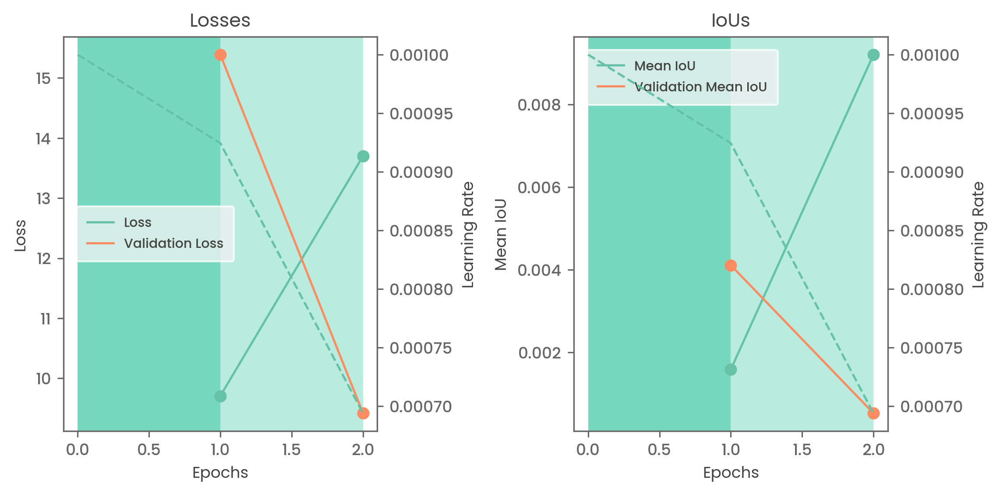

In [75]:
def mark_max_min(ax, column):
    xs = [column.idxmin(), column.idxmax()]
    ys = [column.min(), column.max()]
    
    ax.scatter(xs, ys, zorder=2)

def plot_metrics(ax, df, name, title=None):
    # Plot training metrics
    sns.lineplot(ax=ax, x='Epochs', y=name, data=df, label=name)
    mark_max_min(ax, df[name])

    # Plot validation metrics
    val_name = 'Validation {}'.format(name)
    sns.lineplot(ax=ax, x='Epochs', y=val_name, data=df, label=val_name)
    mark_max_min(ax, df[val_name])

    # Plot learning rates on the right Y-axis
    lr_ax = ax.twinx()
    sns.lineplot(ax=lr_ax, x='Epochs', y='Learning Rate', data=df, linestyle='--')

    for index, lr_value in enumerate(df['Learning Rate'][:-1]):
        ax.axvspan(index, index + 1, fc='#77d8c0', alpha=(1 - (1/(len(df) - 1))*(index)))

    # Label the plots
    ax.legend()
    ax.set_title(title if title else name)

def load_history_as_df(h):
    epochs = len(h['loss'])
    data = list(zip(
        h['loss'],
        h['val_loss'],
        h['mIoU'],
        h['val_mIoU'],
        h['learning_rate'],
    ))

    df = pd.DataFrame(data, columns=[
        'Loss',
        'Validation Loss',
        'Mean IoU',
        'Validation Mean IoU',
        'Learning Rate'
    ], index=range(1, epochs + 1))

    df.at[0, 'Learning Rate'] = LEARNING_RATE
    df = df.sort_index()
    df['Epochs'] = df.index

    return df

def plot_history(h):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4), facecolor='w', edgecolor='k')
    axes = axes.ravel()

    loss, mIoU = axes

    df = load_history_as_df(h)

    # Plot loss metrics
    plot_metrics(loss, df, 'Loss', title='Losses')

    # Plot loss metrics
    plot_metrics(mIoU, df, 'Mean IoU', title='IoUs')

    plt.tight_layout()

plot_history(hist.history)
hist.history

# Evaluation

## Training Dataset Predictions

Images: (5, 512, 512, 3) Y_True: (5, 512, 512) Y_Pred: (5, 512, 512)


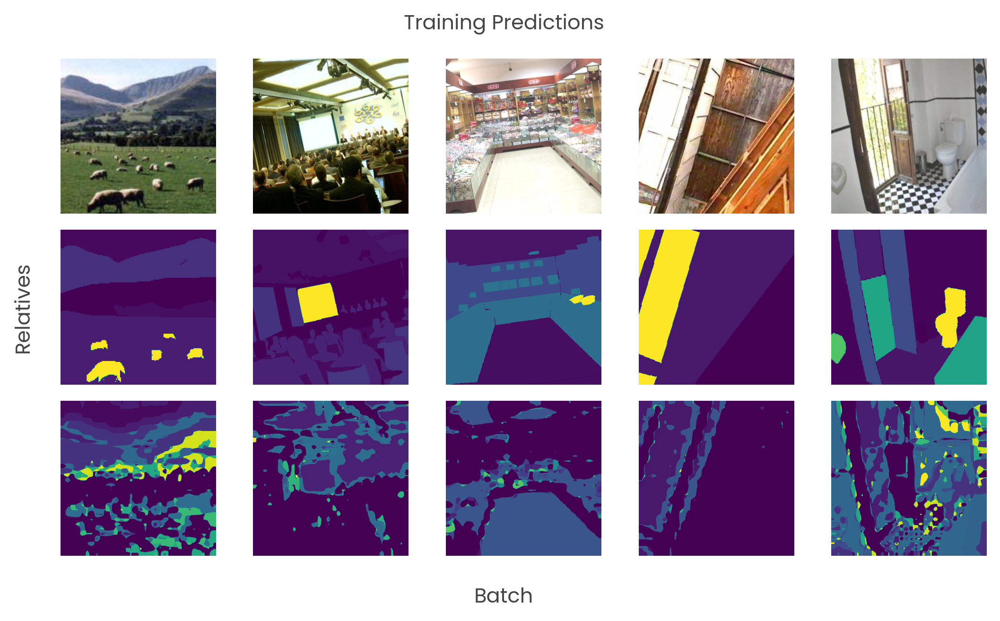

In [76]:
itr = iter(train_prep_ds.batch(8))
images, masks = next(itr)
predictions = tf.math.argmax(model(images), axis=-1)

print(f'Images: {images.shape} Y_True: {masks.shape} Y_Pred: {predictions.shape}')
show_related_images(images, masks, predictions, title='Training Predictions', batch_to_rows=False)

## Validation Dataset Predictions

Images: (5, 512, 512, 3) Y_True: (5, 512, 512) Y_Pred: (5, 512, 512)


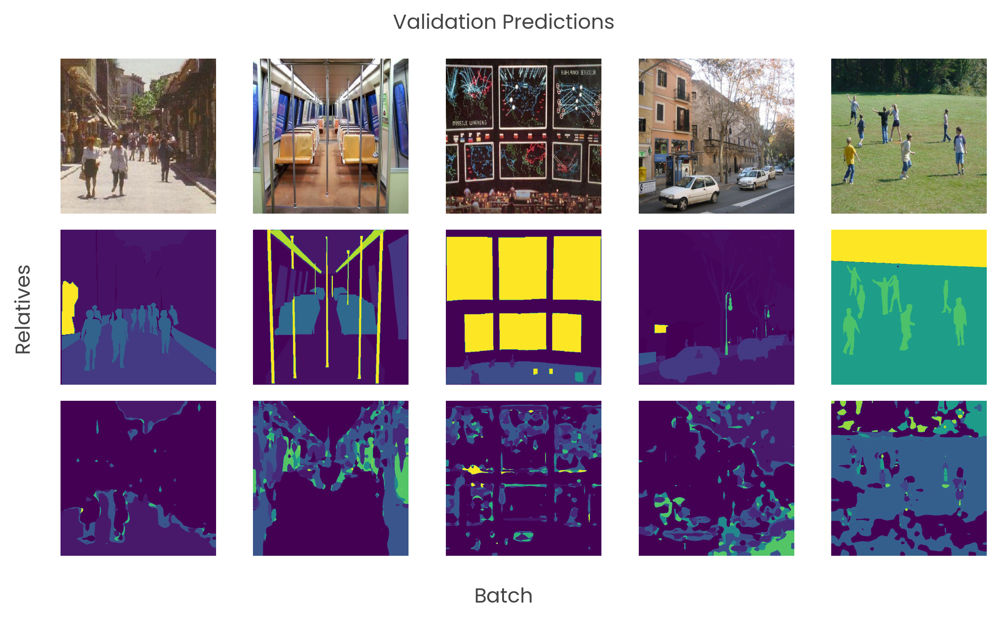

In [77]:
itr = iter(val_prep_ds.batch(8))
images, masks = next(itr)
predictions = tf.math.argmax(model(images), axis=-1)

print(f'Images: {images.shape} Y_True: {masks.shape} Y_Pred: {predictions.shape}')
show_related_images(images, masks, predictions, title='Validation Predictions', batch_to_rows=False)

## Test Dataset Prediction

Images: (5, 512, 512, 3) Y_Pred: (5, 512, 512)


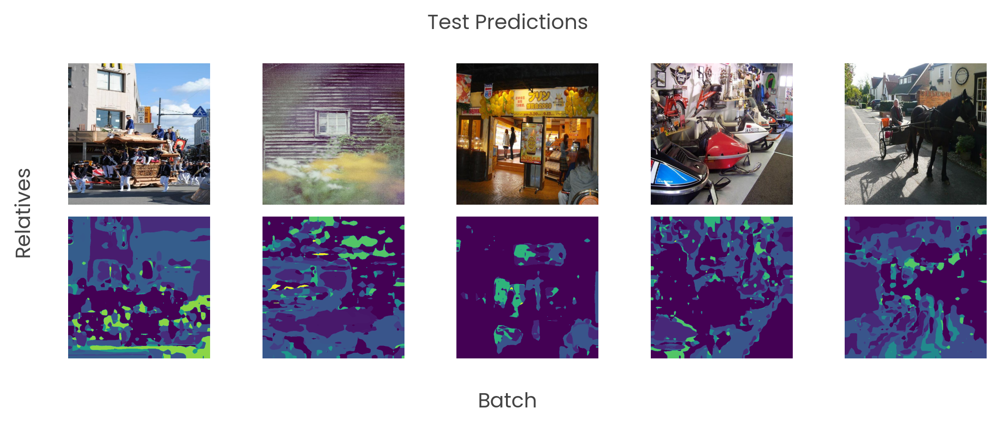

In [78]:
itr = iter(test_prep_ds.batch(8))
images = next(itr)
predictions = tf.math.argmax(model(images), axis=-1)

print(f'Images: {images.shape} Y_Pred: {predictions.shape}')
show_related_images(images, predictions, title='Test Predictions', batch_to_rows=False)